In [178]:
import intake
from easygems import healpix as egh
import healpy as hp

import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)

In [2]:
current_location = "NCAR" #"online"
cat = intake.open_catalog("https://digital-earths-global-hackathon.github.io/catalog/catalog.yaml")[current_location]
#list(cat)

In [166]:
scream = cat['scream2D_hrly'](zoom = 7).to_dask()
scream_z8 = cat['scream2D_hrly'](zoom = 8).to_dask()
scream_z9 = cat['scream2D_hrly'](zoom = 9).to_dask()
scream_z10 = cat['scream2D_hrly'](zoom = 10).to_dask()

## ERA5 

In [146]:
rda_url           = 'https://data.rda.ucar.edu/'
era5_catalog      = rda_url + 'pythia_era5_24/pythia_intake_catalogs/era5_catalog.json'
#rda_data          = "/gpfs/csfs1/collections/rda/data/"
#era5_catalog      = rda_data + 'pythia_era5_24/pythia_intake_catalogs/era5_catalog.json'
era5_cat = intake.open_esm_datastore(era5_catalog)
#era5_cat.df[['long_name','variable', 'units']].drop_duplicates()[190:]#.head()
pre_mean_cat = era5_cat.search(variable='MTPR',frequency = 'hourly',year=2020,month=6)
pre_cat = era5_cat.search(variable='MXTPR',frequency = 'hourly',year=2020,month=6)
#pre_cat.df['path']

/glade/u/apps/opt/conda/envs/2025-digital-earths-global-hackathon/lib/python3.12/site-packages/intake_esm/cat.py:249: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(


In [147]:
xarray_open_kwargs = {
    'engine': 'h5netcdf',
    'chunks': {},  # Specify any chunking if needed
    'backend_kwargs': {}  # Any additional backend arguments if required
}
ds_pre_era5 = pre_cat.to_dataset_dict(xarray_open_kwargs=xarray_open_kwargs)
ds_pre_era5.keys()
ds_pre_mean_era5 = pre_mean_cat.to_dataset_dict(xarray_open_kwargs=xarray_open_kwargs)


--> The keys in the returned dictionary of datasets are constructed as follows:
	'datatype.step_type'



--> The keys in the returned dictionary of datasets are constructed as follows:
	'datatype.step_type'


In [151]:
pre_mean_era5 = ds_pre_mean_era5['fc.meanflux'].MTPR*3.6e3
pre_era5 = ds_pre_era5['fc.minmax'].MXTPR
pre_era5
pre_era5_mmhr = pre_era5*3.6e3
lc = pre_era5_mmhr.coords["longitude"]
la = pre_era5_mmhr.coords["latitude"]
pre_era5_june_subset = pre_era5_mmhr.loc[dict(longitude=lc[(lc > 105) & (lc < 122)], latitude=la[(la > 25) & (la < 33)])]

In [149]:
pre_era5_june=pre_era5_june_subset.mean(axis=(0,1))
pre_era5_june

<xarray.DataArray 'MXTPR' (latitude: 31, longitude: 67)> Size: 8kB
dask.array<mean_agg-aggregate, shape=(31, 67), dtype=float32, chunksize=(31, 67), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float64 248B 32.75 32.5 32.25 ... 25.75 25.5 25.25
  * longitude  (longitude) float64 536B 105.2 105.5 105.8 ... 121.2 121.5 121.8

Text(0.5, 1.0, 'ERA5 Precip (mm/hr)')

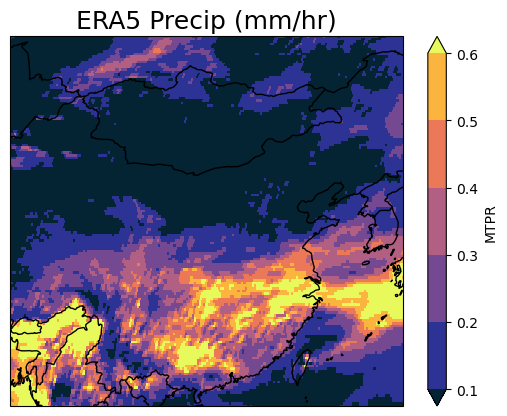

In [165]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cf
import cmocean

projection = ccrs.Robinson(central_longitude=180)
fig, axis = plt.subplots(1, 1, subplot_kw=dict(projection=projection))
#pre_era5_june.plot(
pre_mean_era5.mean(axis=(0,1)).plot(
    ax=axis,
    cmap=cmocean.cm.thermal,
    transform=ccrs.PlateCarree(),
    levels=[0.1,0.2,0.3,0.4,0.5,0.6]
)
extent = [90, 124, 20, 55]
axis.set_extent(extent, crs=ccrs.PlateCarree())
axis.coastlines()
axis.add_feature(cf.BORDERS)
axis.set_title("ERA5 Precip (mm/hr)", fontsize = 18 )

## SCREAM

In [4]:
import cftime 
start_time = cftime.DatetimeNoLeap(2020, 6, 1, 0, 0, 0, 0)
end_time = cftime.DatetimeNoLeap(2020, 6, 30, 0, 0, 0, 0)

In [82]:
import uxarray as ux

uxds = ux.UxDataset.from_healpix(scream)
scream_precip = uxds.pr
#scream_precip
scream_precip_mmhr = scream_precip * 36e5
scream_precip_mmhr_june =  scream_precip_mmhr.sel(time=slice(start_time, end_time))

In [169]:
uxds = ux.UxDataset.from_healpix(scream_z8)
scream8_precip = uxds.pr
scream8_precip_mmhr = scream8_precip * 36e5
scream8_precip_mmhr_june =  scream8_precip_mmhr.sel(time=slice(start_time, end_time))

In [170]:
uxds = ux.UxDataset.from_healpix(scream_z9)
scream9_precip = uxds.pr
scream9_precip_mmhr = scream9_precip * 36e5
scream9_precip_mmhr_june =  scream9_precip_mmhr.sel(time=slice(start_time, end_time))

In [171]:
uxds = ux.UxDataset.from_healpix(scream_z10)
scream10_precip = uxds.pr
scream10_precip_mmhr = scream10_precip * 36e5
scream10_precip_mmhr_june =  scream10_precip_mmhr.sel(time=slice(start_time, end_time))

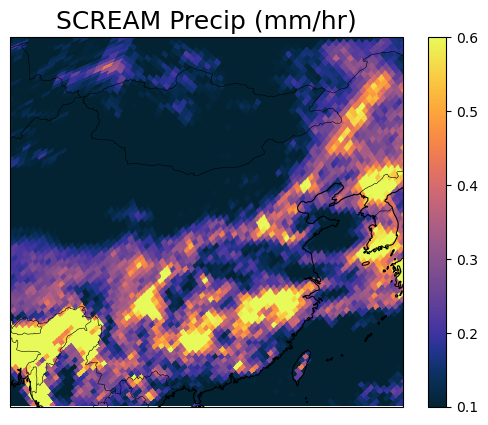

In [164]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cf
import cmocean
from easygems import healpix as egh

projection = ccrs.Robinson(central_longitude=180)
'''
scream_precip_mmhr_june.mean(dim="time").compute().plot(
    projection=projection,
    cmap=cmocean.cm.thermal,
    features=["borders", "coastline"],
    title="SCREAM Precip (zoom=7) June 2020",
    width=1100,
    clim=(0.1,0.6)
)
'''
fig, axis = plt.subplots(1, 1, subplot_kw=dict(projection=projection))
extent = [90, 124, 20, 55]
axis.set_extent(extent, crs=ccrs.PlateCarree())
#egh.healpix_show(scream_precip_june, ax=axes[0], cmap=cmp, vmin=.1, vmax=.6)
axis.add_feature(cf.COASTLINE, linewidth=0.8)
axis.add_feature(cf.BORDERS, linewidth=0.4)
axis.set_title("SCREAM Precip (mm/hr)", fontsize = 18 )
fg = egh.healpix_show(scream_precip_mmhr_june.mean(dim="time"), ax=axis, cmap=cmocean.cm.thermal, vmin=.1, vmax=.6)#cmocean.cm.thermal, vmax=0.5)
fig.colorbar(fg)
plt.show()

In [14]:
lon_bounds = (105, 122)
lat_bounds = (25, 33)

scream_precip_june_subset = scream_precip_mmhr_june.subset.bounding_box(lon_bounds, lat_bounds)

In [173]:
scream8_precip_june_subset = scream8_precip_mmhr_june.subset.bounding_box(lon_bounds, lat_bounds)

In [174]:
scream9_precip_june_subset = scream9_precip_mmhr_june.subset.bounding_box(lon_bounds, lat_bounds)

In [175]:
scream10_precip_june_subset = scream10_precip_mmhr_june.subset.bounding_box(lon_bounds, lat_bounds)

In [15]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cf
import cmocean

projection = ccrs.Robinson(central_longitude=180)

scream_precip_june_subset.mean(dim="time").compute().plot(
    projection=projection,
    cmap=cmocean.cm.thermal,
    features=["borders", "coastline"],
    title="SCREAM Precip (zoom=7) June 2020",
    width=1100,
    clim=(0.1,0.6)
)

:Overlay
   .Image.I     :Image   [Longitude,Latitude]   (Longitude_Latitude pr)
   .Coastline.I :Feature   [Longitude,Latitude]
   .Borders.I   :Feature   [Longitude,Latitude]

In [143]:
import numpy as np
bins = np.logspace(np.log10(0.5), np.log10(30), 300)
histogram_scream, _ = np.histogram(
    scream_precip_june_subset, bins, density=True
)
histogram_era5, _ = np.histogram(
    pre_era5_mmhr_subset, bins, density=True)

In [176]:
histogram_scream8, _ = np.histogram(
    scream8_precip_june_subset, bins, density=True)
histogram_scream9, _ = np.histogram(
    scream9_precip_june_subset, bins, density=True)
histogram_scream10, _ = np.histogram(
    scream10_precip_june_subset, bins, density=True)

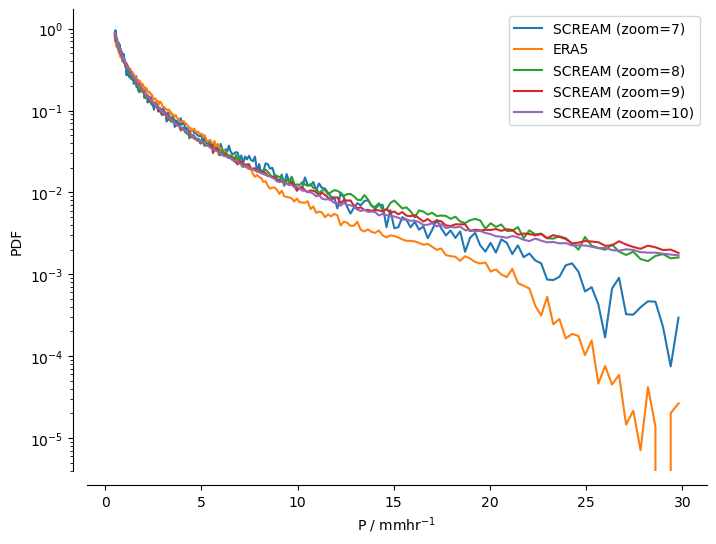

In [177]:
import seaborn as sns
xaxis = (bins[1:] + bins[:-1]) / 2
fig, ax = plt.subplots(figsize=(8, 6), facecolor="white")
plt.plot(xaxis, histogram_scream, label="SCREAM (zoom=7)")#"Yangtze River Region, CHN")
plt.plot(xaxis, histogram_era5, label="ERA5")
plt.plot(xaxis, histogram_scream8, label="SCREAM (zoom=8)")
plt.plot(xaxis, histogram_scream9, label="SCREAM (zoom=9)")
plt.plot(xaxis, histogram_scream10, label="SCREAM (zoom=10)")
ax.set_yscale("log")
ax.set_xlabel("P / mmhr$^{-1}$")
ax.set_ylabel("PDF")
sns.despine(offset=10)
plt.legend()